## Data Augmentation

### 1) 다양한 Image Augmentation 방법

#### 1. Flipping
- Flip은 이미지를 대칭하는 기능이다. 좌우 또는 상하로 이미지를 반전시키는 방법이다.  


- 주의해야할 점으로는 상하나 좌우가 반정될 경우에 다른 글자가 될 가능성이 있다.  


#### 2. Gray scale
- `Gray scale`은 3가지 채널을 가진 RGB 이미지를 하나의 채널을 가지도록 표현해준다.  


- RGB 각각의 채널마다 가중치를 주어 가중합(weighted sum)을 했다. 결로능로 사용된 가중치의 경우 합이 1이 된다.  


#### 3. Saturation
- `Saturation`은 RGB 이미지를 HSV(Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현) 이미지로 변경해주고 S(Saturation) 채널에 오프셋(offset)을 적용해 좀 더 이미지를 선명하게 만들어준다.  


- 그 후 다시 우리가 사용하는 RGB 색상 모델로 변경해준다.  


### 참고
```
Gray 모델 - 색(Color) 정보를 사용하지 않고, 밝기 정보만으로 영상을 표현하는 것입니다.검정 (0) 부터 흰색 (255) 까지 총 256 단계의 밝기 값(Intensity)으로 영상 픽셀 값을 표현합니다.

RGB 모델 - 가장 기본적인 색상 모델로, 색(Color)을 Red, Green, Blue의 3가지 성분의 조합으로 생각하는 것을 말합니다. RGB 모델에서 검은색은 R = G = B = 0, 흰색은 R = G = B = 255, 빨간색은 R = 255, G = B = 0, 노란색은 R = G = 255, B = 0으로 표현합니다. R = G = B 인 경우는 무채색인 Gray 색상이 됩니다. R, G, B 각각은 0 ~ 255 사이의 값을 가질 수 있으므로, RGB 색상 모델을 사용하면 총 256 256 256 = 16,777,216 가지의 색을 표현할 수 있습니다. ex)(0, 0, 0) : 검정,(255, 255, 255) : 흰색,(255, 0, 0) : 빨강,(0, 255, 0) : 초록,(0, 0, 255) : 파랑

HSV 모델 - Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현합니다. Hue는 색조 ( 예 : 붉은색 계열인지 푸른색 계열인 지) 를 나타내고, Saturation은 그 색이 얼마나 선명한(순수한) 색인지, Value 는 밝기(Intensity)를 나타냅니다. HSV 모델은 우리가 색을 가장 직관적으로 표현할 수 있는 모델이고, 머리속에서 상상하는 색을 가장 쉽게 만들어낼 수 있는 모델입니다. 영상처리 / 이미지 처리 에서 HSV 모델을 사용할 때, H, S, V 각각은 0 ~ 255 사이의 값으로 표현됩니다. H 값은 색의 종류를 나타내기에 크기는 의미가 없으며 단순한 인덱스(Index)를 나타냅니다. S 값은 0이면 무채색 (gray 색), 255면 가장 선명한(순수한) 색임을 나타냅니다. V 값은 작을수록 어둡고, 클수록 밝은 색임을 나타냅니다. HSV 색상 모델은 그림과 같이 원뿔(conic) 형태, 원기둥(cylindric) 형태가 있습니다.

YCbCr 모델 - RGB 색에서 밝기 성분(Y)과 색차 정보(Cb, Cr)를 분리하여 표현하는 색상 모델입니다.디지털 영상에서 Y, Cb, Cr 은 각각 0 ~ 255 사이의 값을 가지며, Y가 커지면 그림이 전체적으로 밝아지고, Y가 작아지면 전체적으로 어두워집니다.YCbCr 모델은 mpeg에서 사용되는 색상모델로써, 인간의 눈이 밝기 차에는 민감하지만, 색차에는 상대적으로 둔감하다는 점을 이용해서 Y에서 많은 비트 수(해상도)를 할당하고 Cb, Cr에는 낮은 비트 수를 할당하는 방식으로 비디오를 압축합니다. 따라서 비디오 데이터를 처리할 경우에 YCbCr 모델을 사용하면 별도의 색상 변환을 하지 않아도 되는 장점을 가지고 있습니다.또한, YCbCr 모델은 YUV 모델로도 불립니다.
```

#### 4. Brightness
- `Brightness`를 통해 이미지 밝기를 조절해줄 수도 있다.  


#### 5. Rotation
- `Rotation`을 통해 이미지의 각도를 변환해준다.  


- 유의해야할 경우로는 90도 단위로 돌리지 않은 경우에 직사각형 형태에서 기존 이미지로 채우지 못하는 영역을 어떻게 처리해야할지 신경써야한다.  


#### 6. Center Crop
- `Center crop`은 이미즈의 중앙을 기준으로 확대하는 방법이다.  


- 너무 작게 center crop 하게 되면 본래 가진 라벨과 맞지 않게 되는 상황이 발생할 수 있기 때문에 유의해야한다.  

### 2) Flip
이미지 준비
- `$` ln -s ~/data/* ~/aiffel/data_augmentation/images/

In [1]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME')+'/aiffel/data_augmentation/images/mycat.jpg'
sample_img_path

'/aiffel/aiffel/data_augmentation/images/mycat.jpg'

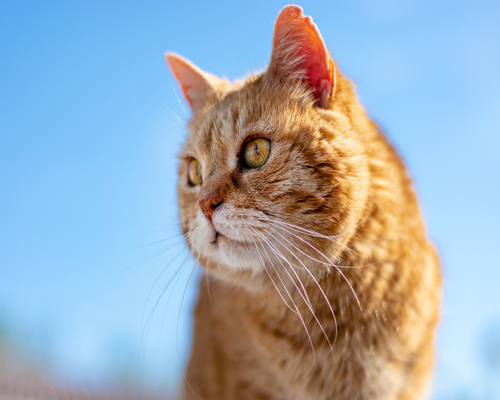

In [2]:
# 이미지를 500,400으로 리사이즈 해주었다.
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

Flip을 적용시킨다. `flip_left_right`, `flip_up_down `을 사용한다.

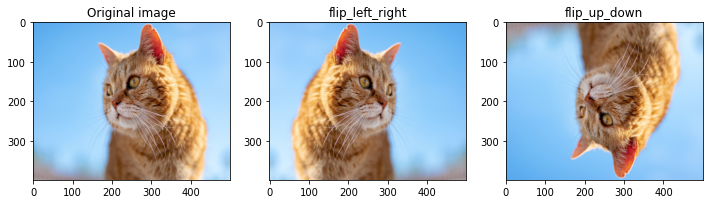

In [3]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

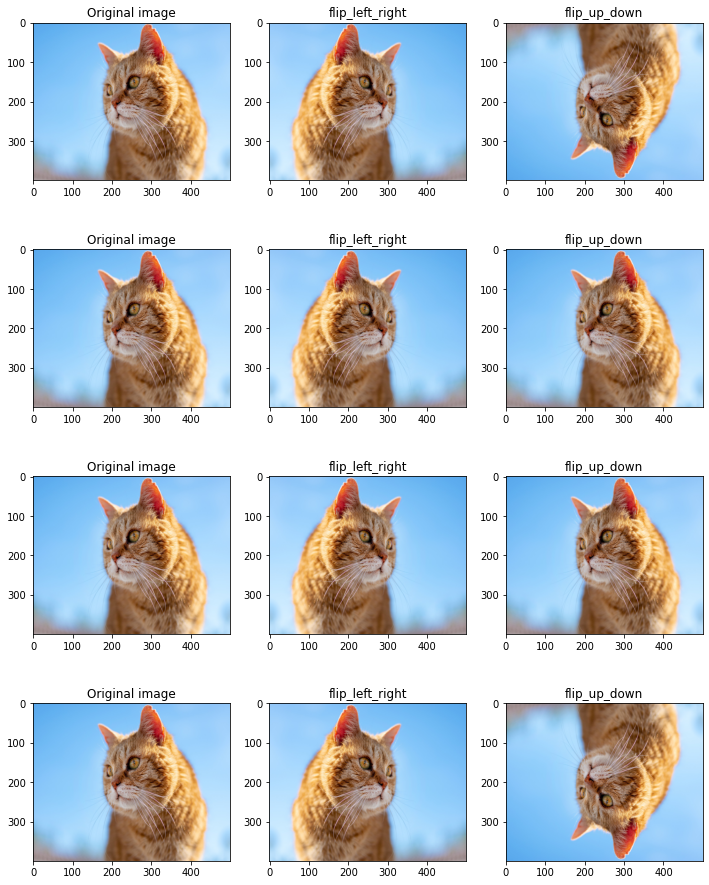

In [4]:
# random augmentation이 어떻게 작동하는지 확인해본다.
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

### 3) Center Crop
- Center Crop은 중앙을 기준으로 자른 이미지를 사용하는 augmentation 기법이다.

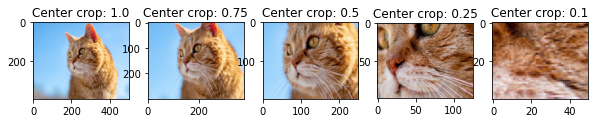

In [5]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

1. 랜덤하게 `centeral_crop`을 적용하는 함수는 텐서플로우에서 기본적으로 제공되지 않는다.  


2. 파이썬의 random 모듈을 사용하셔도 되고 텐서플로우의 랜덤 모듈을 사용해도 된다.  


3. `tf.random.uniform`을 사용해서 `central_fraction` 매개변수에 전달할 값을 만들고 이를 사용해 `cropped_tensor`를 만들어내는 `random_central_crop()` 함수이다.

In [6]:
def random_central_crop(image_tensor, range=(0, 1)):
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor
print('=3')

=3


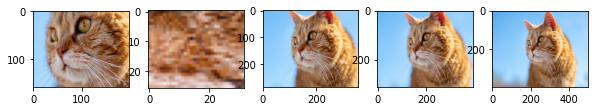

In [7]:
plt.figure(figsize=(12, 15))

col = 5
for i, frac in enumerate(central_fractions):
    cropped_tensor =random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

### 4) 직접 활용해보기

`tf.image.random_crop()`와 `tf.image.random_brightness()`를 사용해본다.

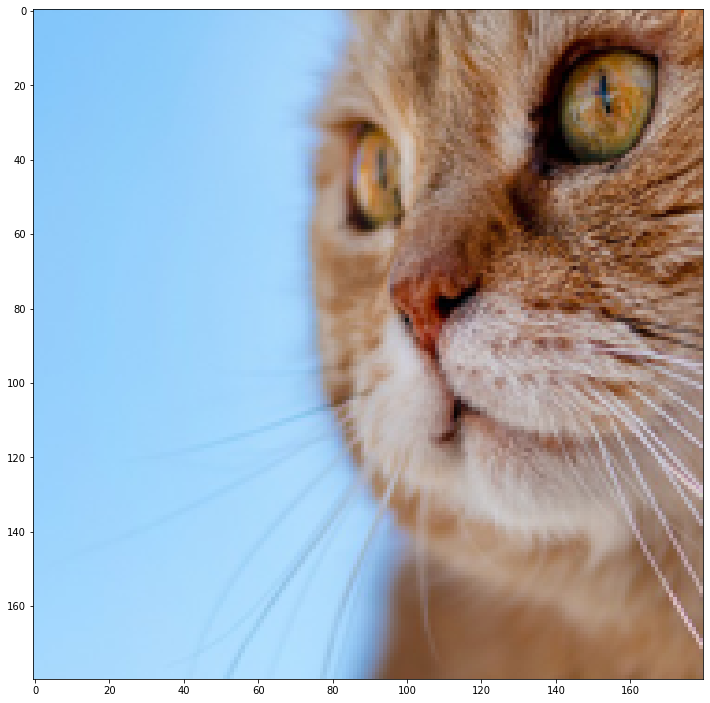

In [8]:
# tf.image.random_crop()을 적용해본다.

# apply random_crop on cat image
plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image_tensor,[180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

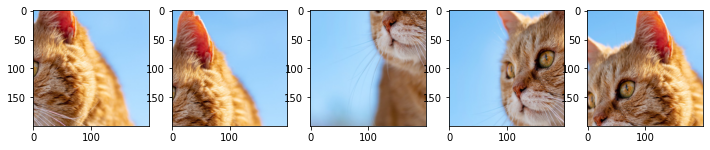

In [11]:
# display 5 random cropped images
plt.figure(figsize=(12, 15))

for i in range(5):
  random_crop_tensor = tf.image.random_crop(image_tensor,[200,200,3])
  random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
  plt.subplot(1,5,i+1)
  plt.imshow(random_crop_image)

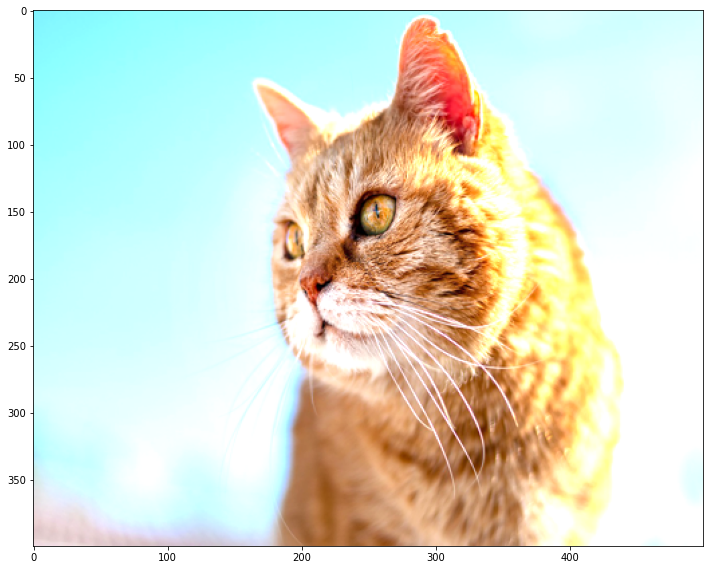

In [9]:
# tf.image.random_brightness()을 적용해본다.

# apply random_brightness on cat image
plt.figure(figsize=(12,15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

```
tf.image.random_brightness()만 적용할 경우 이미지 텐서 값의 범위가 0~255를 초과하게 될 수도 있습니다. 이 경우 plt.imshow()에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수도 있습니다. 따라서 tf.image.random_brightness() 다음에는 tf.clip_by_value()를 적용해 주는 것을 잊지 마세요.
```

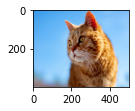

In [10]:
# display 5 random brightness images
plt.figure(figsize=(12,15))

col = 5
for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
    random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)
    
plt.subplot(1, col+1, i+1)
plt.imshow(random_bright_image)

### 5) albumentations 라이브러리 사용해보기

- `Albummentations`는 이미지 증강을 위한 Python 라이브러리이다.  


- 이미지 증강은 딥러닝 및 컴퓨터 비전 작업에서 훈련된 모델의 품질을 높이는데 사용된다.  


- `augmentation`에서는 배열을 이미지의 기본 형태로 사용한다. 따라서 PIL Image 데이터 넘파이 배열로 변환하여 사용하도록 한다.

In [12]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [13]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

print("슝")

슝


### augmentation 기법 사용해보기

#### transforms.Affine()
- `Affine()`은 아핀 변환(Affine transform)을 이미지에 적용한다.  


- 2D 변환의 일종인 아핀 변환은 이미지의 스케일을 조절하거나 평행이동, 또는 회전 등의 변환을 줄 수 있다.

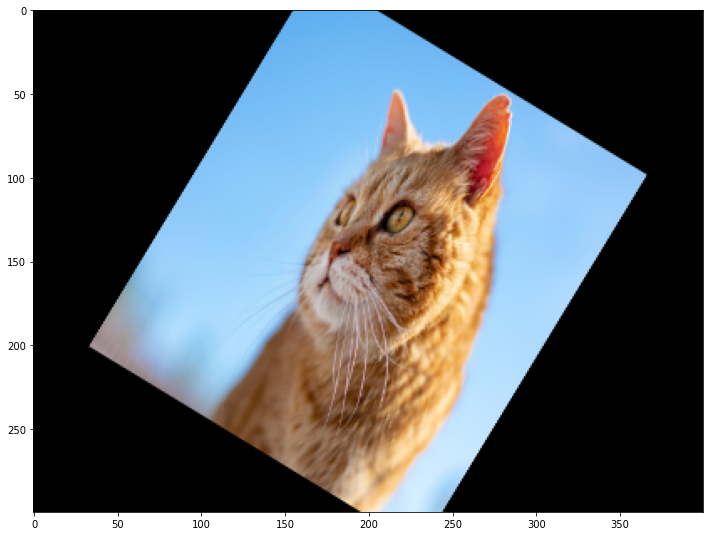

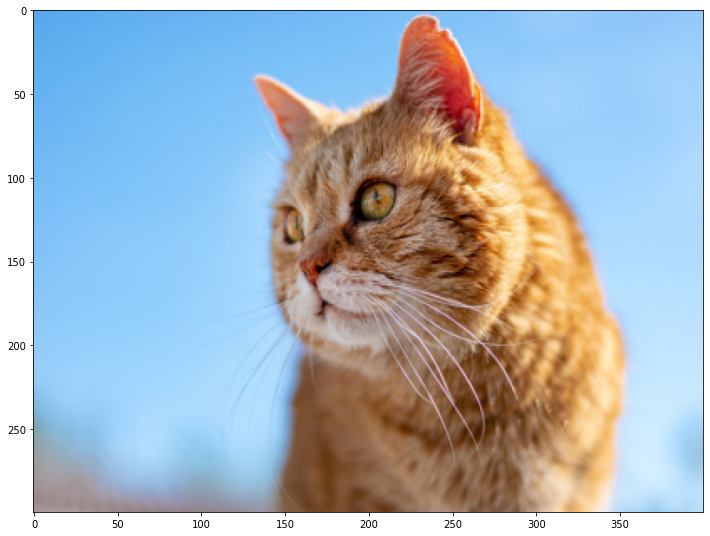

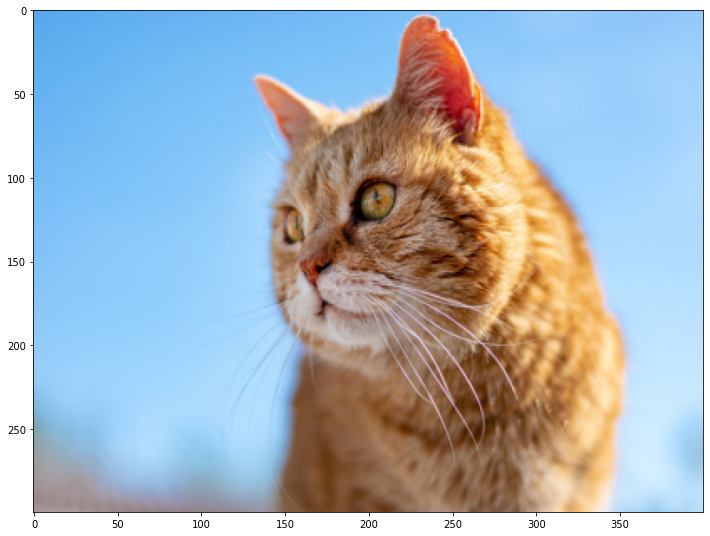

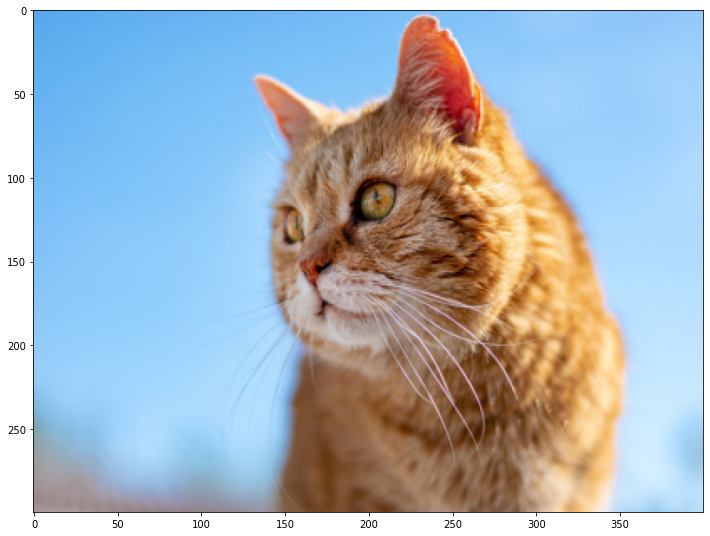

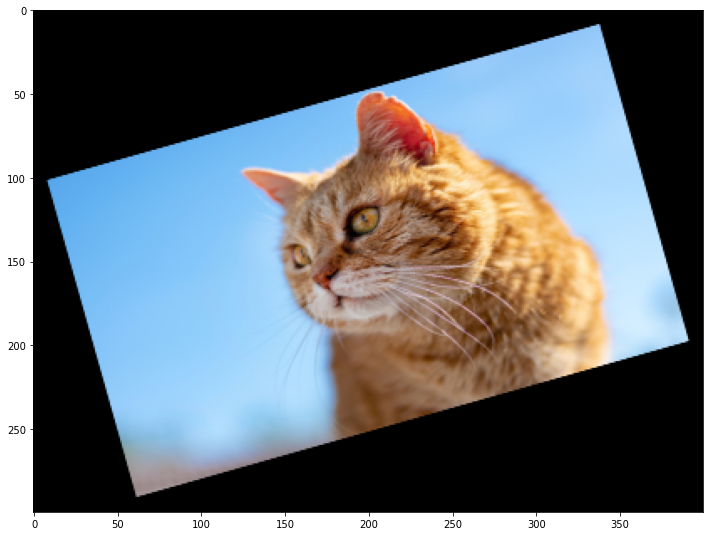

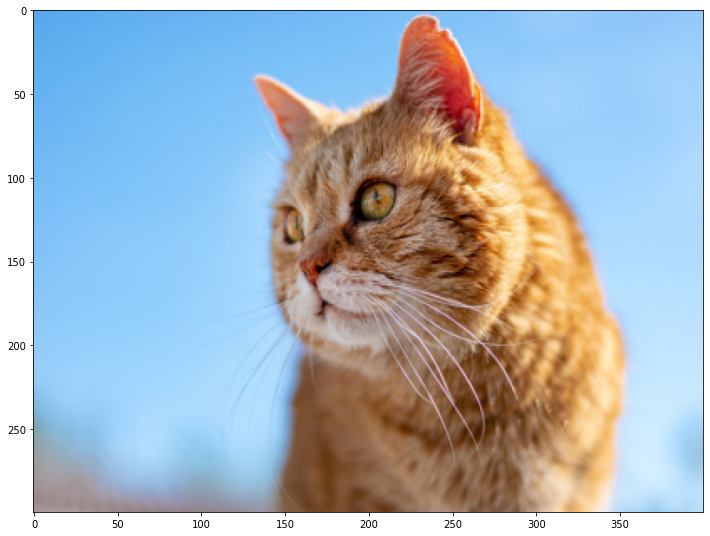

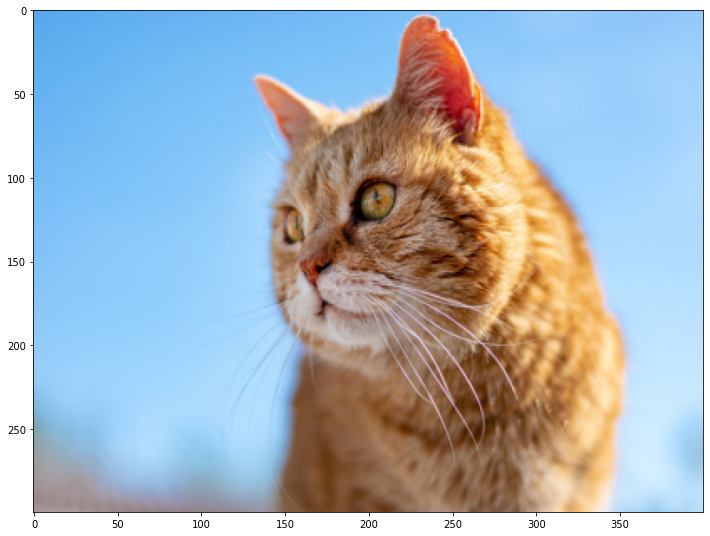

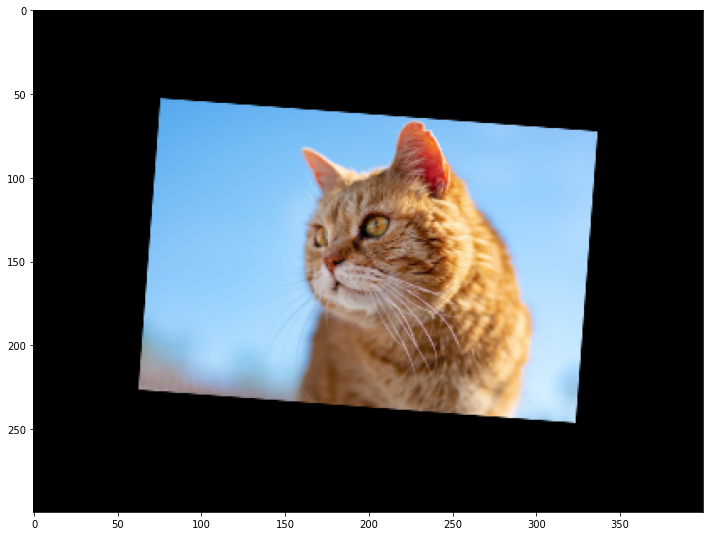

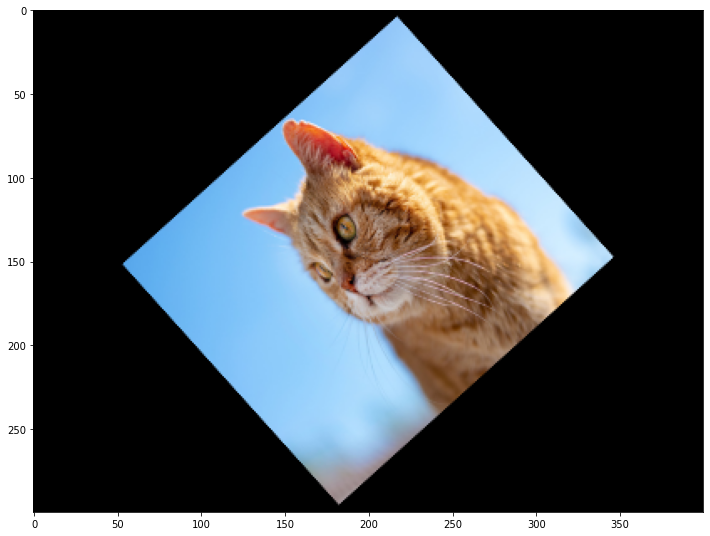

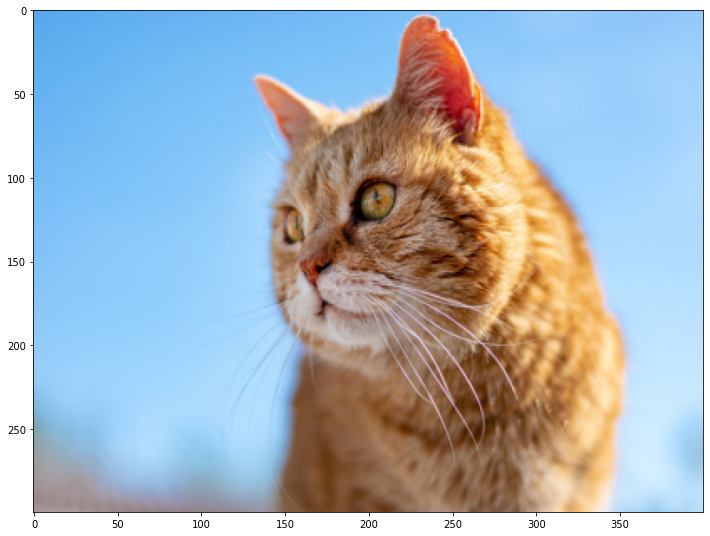

In [14]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

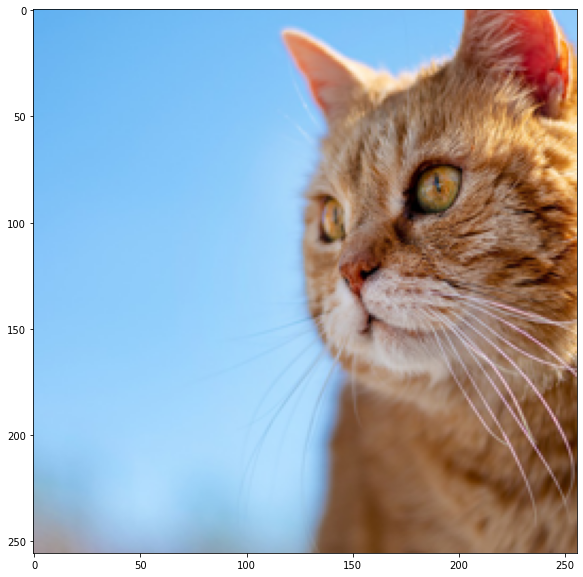

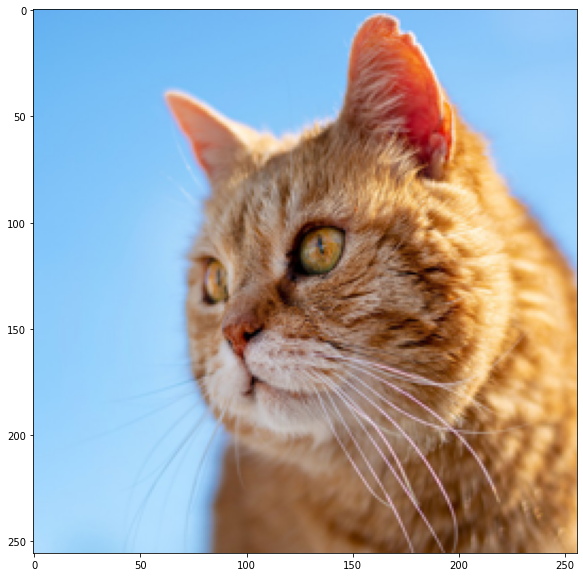

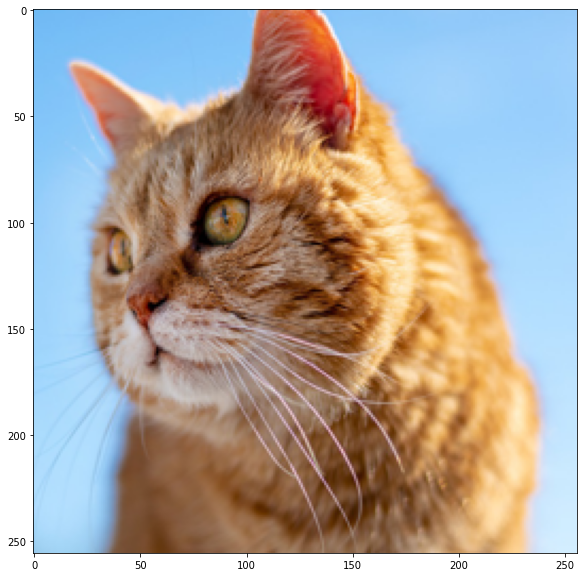

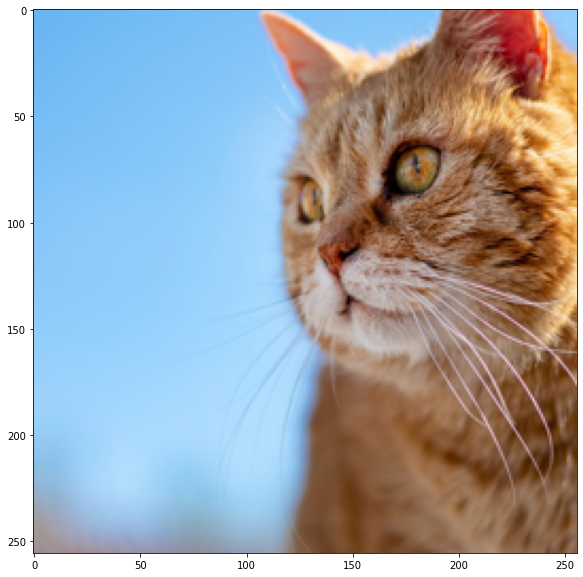

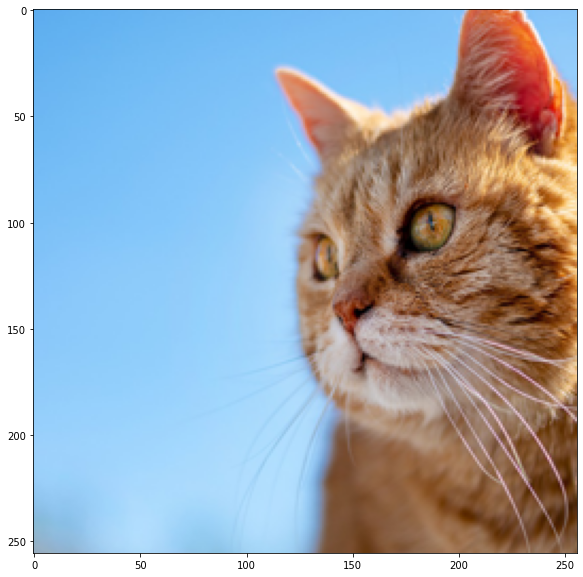

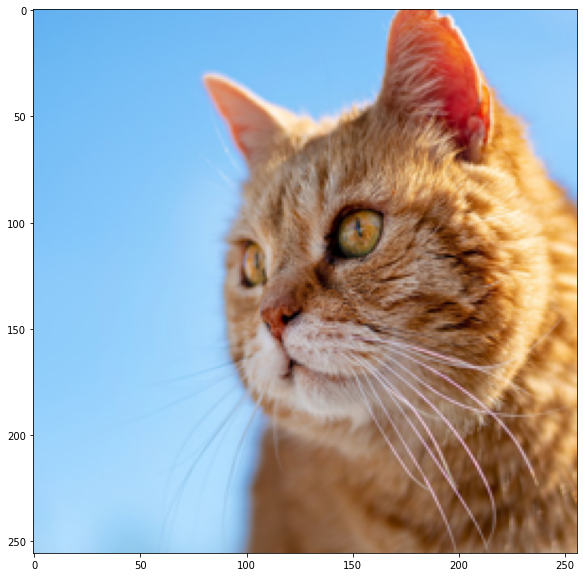

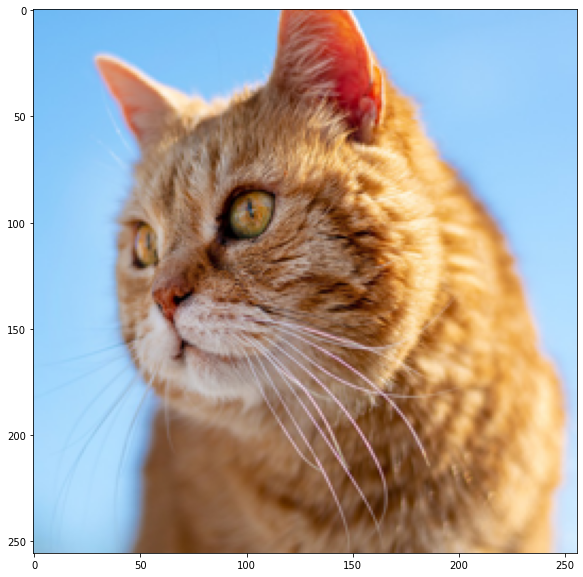

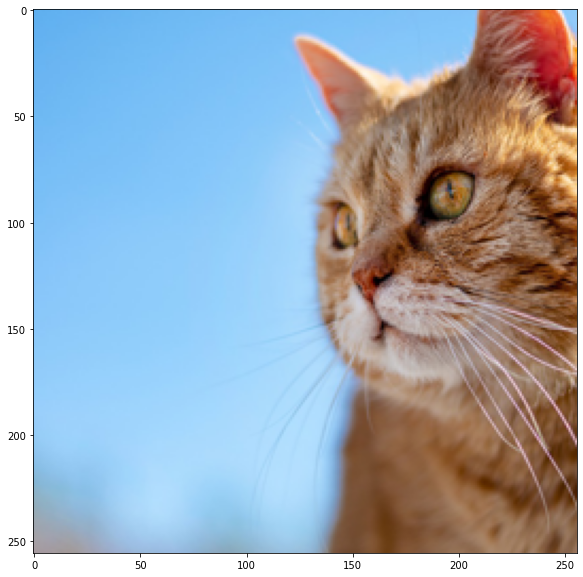

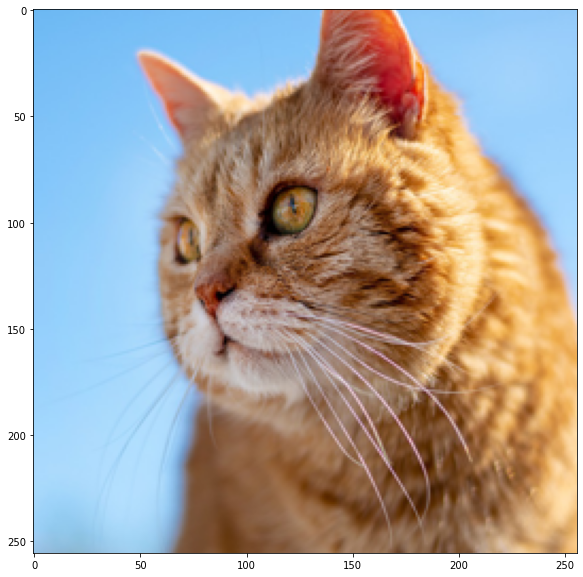

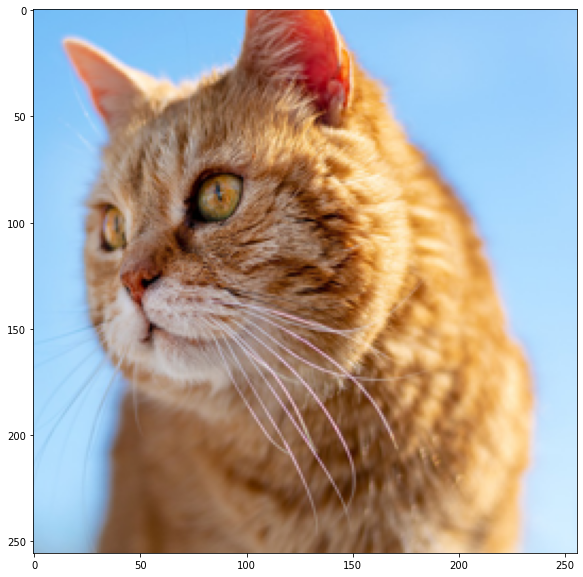

In [15]:
# transforms.RandomCrop()
import random
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

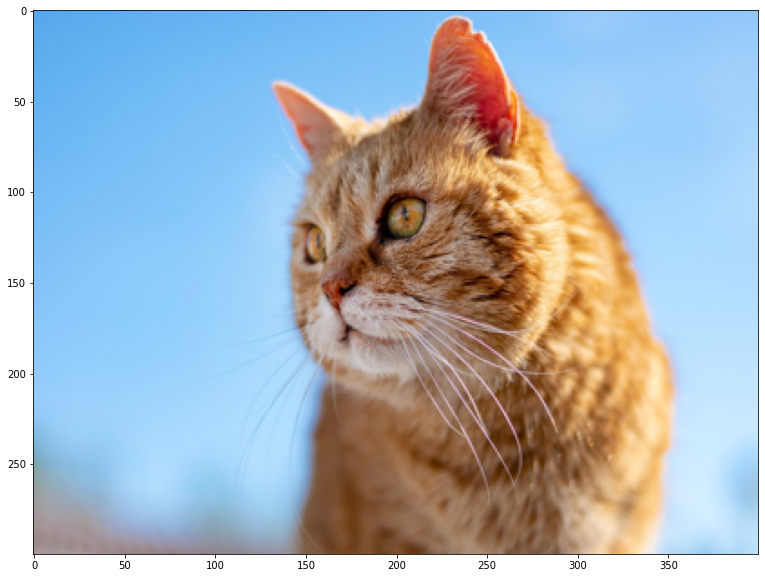

In [16]:
# MedianBlur()을 활용하여 블러처리를 할 수 있다.

transform = A.Compose(
    [
    A.MedianBlur (blur_limit=7, always_apply=False, p=0.5)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

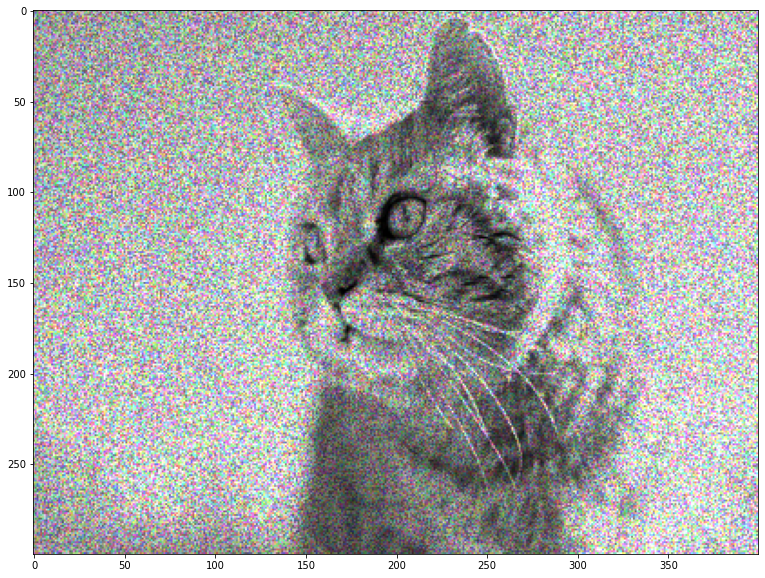

In [17]:
# ToGray().MultiplicativeNoise()는 여러가지 기법을 한번에 조합하여 사용하기 위한 코드이다.

transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
    
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

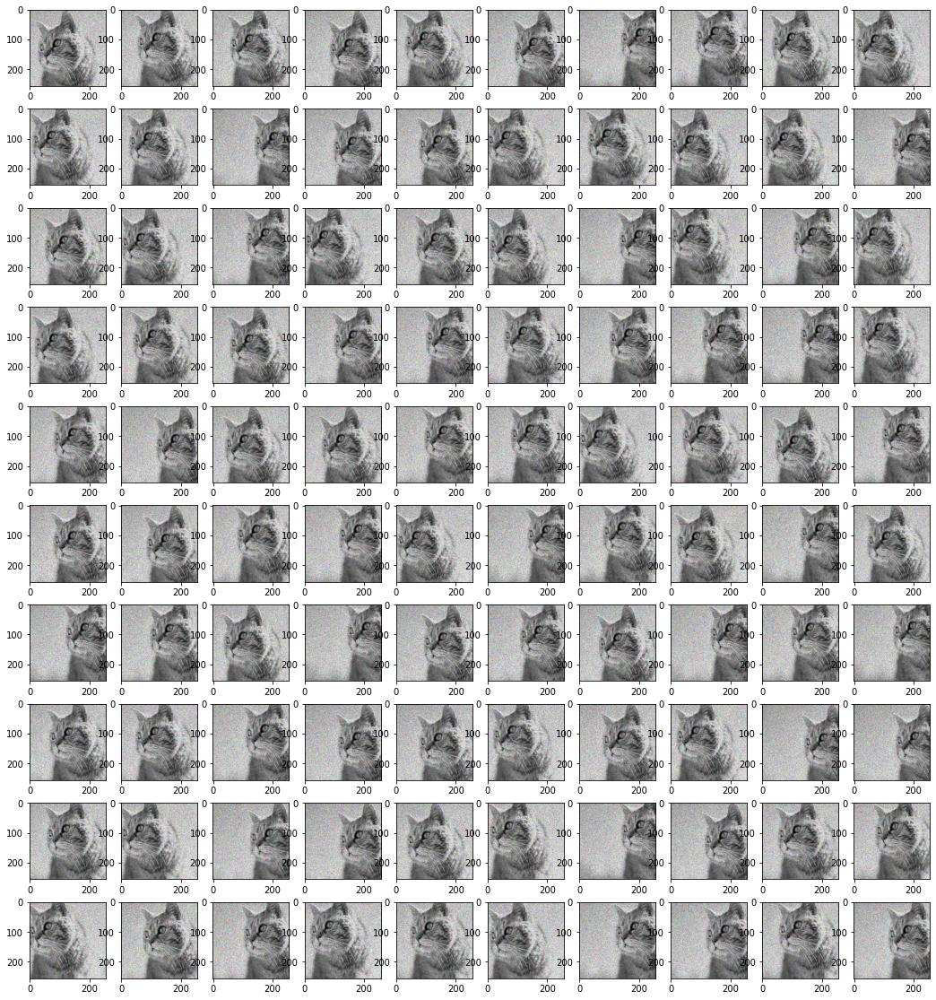

In [18]:
# 그레이 색상의 노이즈가 있는 RandomCrop()을 사용해 100장을 시각화해본다.

# Use various techniques and functions in albumentations library. show 100 images.
def transform_data(img_arr):
    transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], 
                          elementwise=True, per_channel=True, p=1),
     A.RandomCrop(width=256, height=256)
    ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)

### 더 나아간 기법들

지금까지 우리가 보아왔던 방식은 딥러닝이 아닌 일정한 수학적 알고리즘을 적용한 augmentation들입니다. 하지만 딥러닝이 발전함에 따라 data augmentation에도 딥러닝을 활용하는 방식이 개발되고 있습니다.

대표적으로 `GAN`을 Data augmentation에 활용할 수 있습니다. 쉬운 예로는 전통적인 색상 변환 대신 스타일 트랜스퍼(style transfer) 모델을 적용해 볼 수 있겠습니다.

아래 논문에서는 전통적인 augmentation 방법과 GAN을 활용한 augmentation을 적용하여 효과를 실험했습니다. 자세한 내용은 논문을 참고하세요~!

- http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf

